In [43]:
import pandas as pd
import numpy as np
import datetime as dt
import plotly as ply
from sklearn.model_selection import ShuffleSplit as ss
from sklearn.linear_model import LogisticRegression as lr
from sklearn import metrics as mt
from sklearn.preprocessing import StandardScaler as sts
from sklearn.pipeline import Pipeline as pl
from sklearn.svm import SVC
from matplotlib import pyplot as plt
from __future__ import print_function as pr
from scipy import stats

##working object will be read latter on
#rainfall_original = pd.read_csv('weatherAus.csv')

In [44]:
#read in data set
rainfall = pd.read_csv('rainfall.csv', index_col=0) 
rainfall.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140787 entries, 0 to 140786
Data columns (total 23 columns):
Date             140787 non-null object
Location         140787 non-null object
MinTemp          140787 non-null float64
MaxTemp          140787 non-null float64
Rainfall         140787 non-null float64
Evaporation      97184 non-null float64
Sunshine         89329 non-null float64
WindGustDir      134862 non-null float64
WindGustSpeed    134862 non-null float64
WindDir9am       140787 non-null float64
WindDir3pm       140787 non-null float64
WindSpeed9am     140787 non-null float64
WindSpeed3pm     140787 non-null float64
Humidity9am      140787 non-null float64
Humidity3pm      140787 non-null float64
Pressure9am      129190 non-null float64
Pressure3pm      129190 non-null float64
Cloud9am         107253 non-null float64
Cloud3pm         107253 non-null float64
Temp9am          140787 non-null float64
Temp3pm          140787 non-null float64
RainToday        140787 non-null

In [45]:
print ('Shape of Data Set is', rainfall.shape)

Shape of Data Set is (140787, 23)


In [29]:
#sort by least to greatest number of observations by feature
rainfall.count().sort_values()

Sunshine          89329
Evaporation       97184
Cloud3pm         107253
Cloud9am         107253
Pressure3pm      129190
Pressure9am      129190
WindGustDir      134862
WindGustSpeed    134862
Date             140787
Temp3pm          140787
Temp9am          140787
Humidity3pm      140787
Humidity9am      140787
WindSpeed9am     140787
RainToday        140787
WindDir3pm       140787
WindDir9am       140787
Rainfall         140787
MaxTemp          140787
MinTemp          140787
Location         140787
WindSpeed3pm     140787
RainTomorrow     140787
dtype: int64

In [46]:
#find the percentage of missing values for each feature
missing_perc = rainfall.isnull().sum()/len(rainfall)*100
missing_perc

Date              0.000000
Location          0.000000
MinTemp           0.000000
MaxTemp           0.000000
Rainfall          0.000000
Evaporation      30.970899
Sunshine         36.550250
WindGustDir       4.208485
WindGustSpeed     4.208485
WindDir9am        0.000000
WindDir3pm        0.000000
WindSpeed9am      0.000000
WindSpeed3pm      0.000000
Humidity9am       0.000000
Humidity3pm       0.000000
Pressure9am       8.237266
Pressure3pm       8.237266
Cloud9am         23.818961
Cloud3pm         23.818961
Temp9am           0.000000
Temp3pm           0.000000
RainToday         0.000000
RainTomorrow      0.000000
dtype: float64

In [47]:
#features with less than 80% data will be removed: Evaporation, Sunshine, Cloud9am, Cloud3pm
#also dropping date, location since both are not important to prediction model
rainfall = rainfall.drop(['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm', 'Date', 'Location'], axis = 1)

In [48]:
print ('Shape of Data Set is', rainfall.shape)

Shape of Data Set is (140787, 17)


In [49]:
#Getting rid of all NaN values in data set
rainfall = rainfall.dropna(how='any')

In [50]:
print ('Shape of Data Set is', rainfall.shape)

Shape of Data Set is (126194, 17)


In [51]:
#any Z-scores > 3 is detected as outliers and removed
from scipy import stats
z = np.abs(stats.zscore(rainfall._get_numeric_data()))
print(z)
rainfall= rainfall[(z < 3).all(axis=1)]
print ('Shape of Data Set is', rainfall.shape)

[[0.1588738  0.08383138 0.20444548 ... 0.02490564 0.53411675 0.53115024]
 [0.77941201 0.23005718 0.27457013 ... 0.34113241 0.53411675 0.53115024]
 [0.08068331 0.31566315 0.27457013 ... 0.18007567 0.53411675 0.53115024]
 ...
 [1.37365969 0.2585925  0.27457013 ... 0.37041545 0.53411675 0.53115024]
 [1.09217395 0.48687509 0.27457013 ... 0.6046798  0.53411675 0.53115024]
 [0.71685963 0.50114275 0.27457013 ... 0.59003828 0.53411675 0.53115024]]
Shape of Data Set is (120659, 17)


In [52]:
# we want to predict the X and y data as follows:
if 'RainTomorrow' in rainfall:
    y = rainfall['RainTomorrow'].values # get the labels we want
    del rainfall['RainTomorrow'] # get rid of the class label
    x = rainfall.values # use everything else to predict!  
    
# split our data into training and testing splits
num_cv_iterations = 5
num_instances = len(y)
cv_object = ss(n_splits=num_cv_iterations, test_size  = 0.2)
                         
print(cv_object)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.2, train_size=None)


## Logistic Regression

In [53]:
import time
# iterate over the coefficients
column_names = rainfall.columns
weights = []
weights_array = []

scl_obj = sts()
t0=time.time()
for iter_num, (train_indices, test_indices) in enumerate(cv_object.split(x,y)):
    scl_obj.fit(x[train_indices]) # find scalings for each column that make this zero mean and unit std

    X_train_scaled = scl_obj.transform(x[train_indices]) # apply to training
    X_test_scaled = scl_obj.transform(x[test_indices]) # apply those means and std to the test set (without snooping at the test set values)

    # train the model just as before
    lr_clf = lr(penalty='l2', C=0.05) # get object, the 'C' value is less (can you guess why??)
    lr_clf.fit(X_train_scaled,y[train_indices])  # train object

    y_hat = lr_clf.predict(X_test_scaled) # get test set precitions
    
    acc = mt.accuracy_score(y[test_indices],y_hat)
    conf = mt.confusion_matrix(y[test_indices],y_hat)
    print("")
    print('accuracy:', acc )
    print(conf )
    print ("Time to Run:", time.time()-t0)

    # sort these attributes and spit them out
    #zip_vars = zip(lr_clf.coef_.T,column_names) # combine attributes
    #zip_vars = sorted(zip_vars)
    zip_vars = pd.Series(lr_clf.coef_[0].T, index=column_names)
    for name, coef in zip_vars.items():
        print(name, 'has weight of', coef) # now print them out
        weights.append(coef)
    weights_array.append(weights)
    weights = []
weights_array = np.array(weights_array)


accuracy: 0.8502817835239516
[[18187   894]
 [ 2719  2332]]
Time to Run: 0.9471721649169922
MinTemp has weight of 0.14117842474327164
MaxTemp has weight of 0.00994295731424574
Rainfall has weight of 0.09924689488219642
WindGustDir has weight of 0.04193691189208323
WindGustSpeed has weight of 0.7669211953205122
WindDir9am has weight of -0.12151467995899012
WindDir3pm has weight of 0.11112200305338107
WindSpeed9am has weight of -0.08690604278347287
WindSpeed3pm has weight of -0.345895852572381
Humidity9am has weight of 0.08492985022881379
Humidity3pm has weight of 1.2690886069435
Pressure9am has weight of 1.0085572467532655
Pressure3pm has weight of -1.4498377297975193
Temp9am has weight of 0.09612570096898211
Temp3pm has weight of -0.373044359784319
RainToday has weight of 0.16897178376511773

accuracy: 0.8560417702635504
[[18302   878]
 [ 2596  2356]]
Time to Run: 1.8490171432495117
MinTemp has weight of 0.16312607577953733
MaxTemp has weight of 0.0466599884007109
Rainfall has weight 

In [54]:
ply.offline.init_notebook_mode() # run at the start of every notebook

mean_weights = np.mean(weights_array,axis = 0)
std_weights = np.std(weights_array,axis = 0)
final_array = pd.DataFrame(data={'mean':mean_weights, 'std':std_weights}, index = column_names)
final_array = final_array.sort_values(by=['mean'])

error_y=dict(
            type='data',
            array=final_array['std'].values,
            visible=True
        )

graph1 = {'x': final_array.index,
          'y': final_array['mean'].values,
    'error_y':error_y,
       'type': 'bar'}

fig = dict()
fig['data'] = [graph1]
fig['layout'] = {'title': 'Logistic Regression Weights, with error bars'}

ply.offline.iplot(fig)


## Support Vector Machines

In [55]:
weights = []
weights_array = []
t0=time.time()

# okay, so run through the cross validation loop and set the training and testing variable for one single iteration
for train_indices, test_indices in cv_object.split(x,y): 
    # I will create new variables here so that it is more obvious what 
    # the code is doing (you can compact this syntax and avoid duplicating memory,
    # but it makes this code less readable)
    X_train = x[train_indices]
    y_train = y[train_indices]
    
    X_test = x[test_indices]
    y_test = y[test_indices]
    
    X_train_scaled = scl_obj.transform(X_train) # apply to training
    X_test_scaled = scl_obj.transform(X_test) 
    
    #train the model just as before
    svm_clf = SVC(C=0.5, kernel='linear', degree=3, gamma='auto') # get object
    svm_clf.fit(X_train_scaled, y_train)  # train object

    y_hat = svm_clf.predict(X_test_scaled) # get test set precitions

    acc = mt.accuracy_score(y_test,y_hat)
    conf = mt.confusion_matrix(y_test,y_hat)
    print("")
    print('accuracy:', acc )
    print(conf)
    print ("Time to Run:", time.time()-t0)
    
    # sort these attributes and spit them out
    zip_vars = pd.Series(svm_clf.coef_[0],index=column_names) # combine attributes
    for name, coef in zip_vars.items():
        print(name, 'has weight of', coef) # now print them out
        weights.append(coef)
    weights_array.append(weights)
    weights = []
weights_array = np.array(weights_array)



accuracy: 0.8530581800099453
[[18487   716]
 [ 2830  2099]]
Time to Run: 405.0945370197296
MinTemp has weight of 0.02011903876427823
MaxTemp has weight of 0.2001877481206975
Rainfall has weight of 0.10457872429333293
WindGustDir has weight of 0.01506641584001045
WindGustSpeed has weight of 0.4806900599155597
WindDir9am has weight of -0.07251427376786523
WindDir3pm has weight of 0.08828263597047226
WindSpeed9am has weight of -0.034349616135727956
WindSpeed3pm has weight of -0.26056859056257053
Humidity9am has weight of -0.019999250918317557
Humidity3pm has weight of 0.8408962032317504
Pressure9am has weight of 0.6814428251832396
Pressure3pm has weight of -0.9449686522866614
Temp9am has weight of -0.023273294140295775
Temp3pm has weight of -0.3006948052975531
RainToday has weight of 0.08619381294056438

accuracy: 0.8512348748549644
[[18381   696]
 [ 2894  2161]]
Time to Run: 856.7268192768097
MinTemp has weight of 0.00802591167303035
MaxTemp has weight of 0.18570635815103742
Rainfall ha

In [56]:
# look at the support vectors
print(svm_clf.support_vectors_.shape)
print(svm_clf.support_.shape)
print(svm_clf.n_support_ )

(34229, 16)
(34229,)
[17120 17109]


In [57]:
ply.offline.init_notebook_mode() # run at the start of every notebook

mean_weights = np.mean(weights_array,axis = 0)
std_weights = np.std(weights_array,axis = 0)
final_array = pd.DataFrame(data={'mean':mean_weights, 'std':std_weights}, index = column_names)
final_array = final_array.sort_values(by=['mean'])

error_y=dict(
            type='data',
            array=final_array['std'].values,
            visible=True
        )

graph1 = {'x': final_array.index,
          'y': final_array['mean'].values,
    'error_y':error_y,
       'type': 'bar'}

fig = dict()
fig['data'] = [graph1]
fig['layout'] = {'title': 'Support Vector Machines Weights, with error bars'}

ply.offline.iplot(fig)

In [58]:
# Now let's do some different analysis with the SVM and look at the instances that were chosen as support vectors

# now lets look at the support for the vectors and see if we they are indicative of anything
# grabe the rows that were selected as support vectors (these are usually instances that are hard to classify)

# make a dataframe of the training data
df_tested_on = rainfall.iloc[train_indices] # saved from above, the indices chosen for training
# now get the support vectors from the trained model
df_support = df_tested_on.iloc[svm_clf.support_,:]

df_support['RainTomorrow'] = y[svm_clf.support_] # add back in the 'Survived' Column to the pandas dataframe
rainfall['RainTomorrow'] = y # also add it back in for the original data
df_support.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34229 entries, 76764 to 8634
Data columns (total 17 columns):
MinTemp          34229 non-null float64
MaxTemp          34229 non-null float64
Rainfall         34229 non-null float64
WindGustDir      34229 non-null float64
WindGustSpeed    34229 non-null float64
WindDir9am       34229 non-null float64
WindDir3pm       34229 non-null float64
WindSpeed9am     34229 non-null float64
WindSpeed3pm     34229 non-null float64
Humidity9am      34229 non-null float64
Humidity3pm      34229 non-null float64
Pressure9am      34229 non-null float64
Pressure3pm      34229 non-null float64
Temp9am          34229 non-null float64
Temp3pm          34229 non-null float64
RainToday        34229 non-null int64
RainTomorrow     34229 non-null int64
dtypes: float64(15), int64(2)
memory usage: 4.7 MB


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



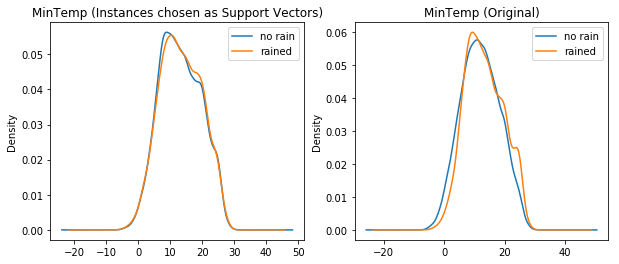

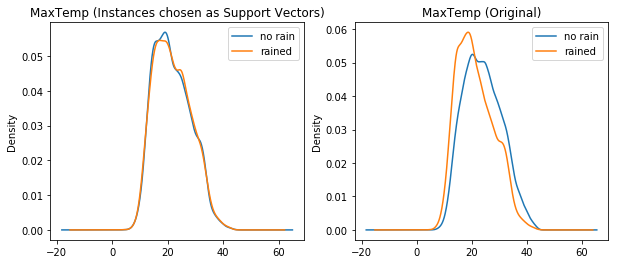

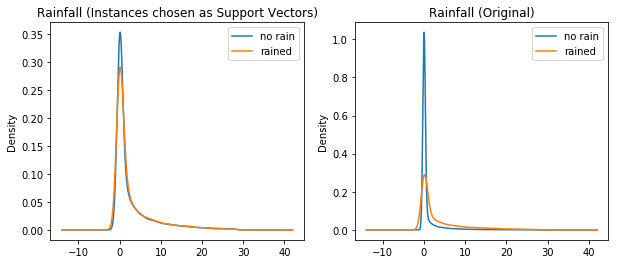

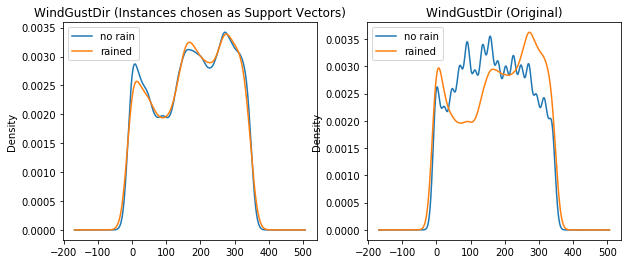

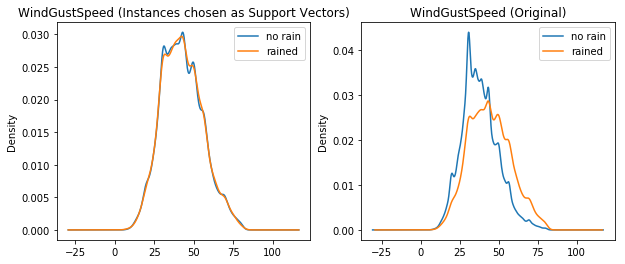

...

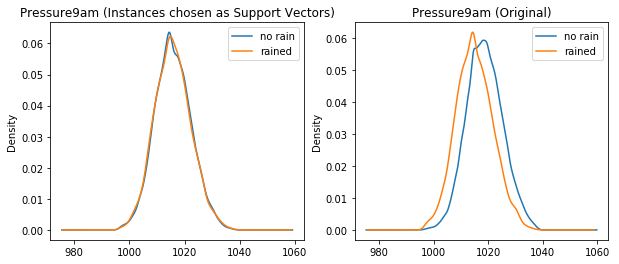

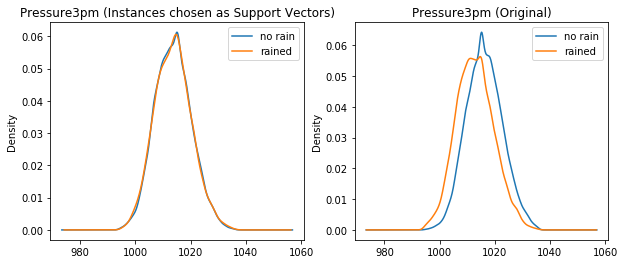

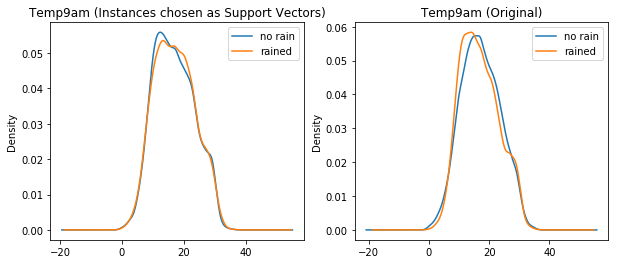

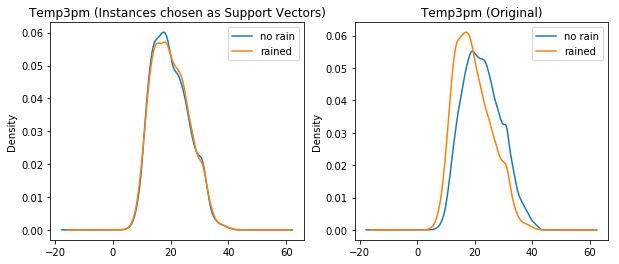

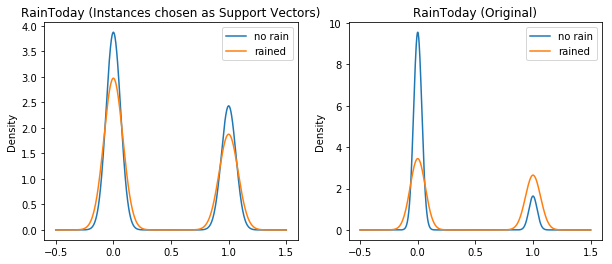

In [59]:
# now lets see the statistics of these attributes
from pandas.tools.plotting import boxplot

# group the original data and the support vectors
df_grouped_support = df_support.groupby(['RainTomorrow'])
df_grouped = rainfall.groupby(['RainTomorrow'])

# plot KDE of Different variables
vars_to_plot = column_names

for v in vars_to_plot:
    plt.figure(figsize=(10,4))
    # plot support vector stats
    plt.subplot(1,2,1)
    ax = df_grouped_support[v].plot.kde() 
    plt.legend(['no rain','rained'])
    plt.title(v+' (Instances chosen as Support Vectors)')
    
    # plot original distributions
    plt.subplot(1,2,2)
    ax = df_grouped[v].plot.kde() 
    plt.legend(['no rain','rained'])
    plt.title(v+' (Original)')